### Acqusition testing
Given we can now generate accurate gold codes, we now need to perform acquisition, searching through SV, frequency offset and code phase to find a correlation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import random
#stack overflow, use the PRN generator we already used and tested
module_path = os.path.abspath(os.path.join('..', 'test'))

# Add to sys.path if not already present
if module_path not in sys.path:
    sys.path.append(module_path)
import ca_code_gen


In [2]:

oversample_ratio = 4.0
chip_rate = 1.023e6
chip_period = 1/chip_rate
sample_period = chip_period/oversample_ratio
raw_filename = "../reference_files/2026-05-21-12-47-42_gps_l1_8b_iq_bitpacked.dat"

### Now perform the receiving
load from the single bit recording (packed bytes)
unpack from bytes and deinterleave to i/q

Writing bit packed to 2026-05-21-12-47-42_gps_l1_8b_iq_bitpacked.dat
Writing dibit packed to 2026-05-21-12-47-42_gps_l1_8b_iq_dibitpacked.dat
Number of Samples: 209715200
Resulting single bit IQ length (bytes): 52428800
For index 0 val [-2.-6.j]
For index 1 val [1.-4.j]
For index 2 val [4.+1.j]
For index 3 val [10.+10.j]
0xd0
For index 4 val [6.-2.j]
For index 5 val [4.-2.j]
For index 6 val [8.-7.j]
For index 7 val [6.-7.j]
0x55
For index 8 val [0.-3.j]
For index 9 val [2.+4.j]
For index 10 val [7.+2.j]
For index 11 val [6.-5.j]
0x41
For index 12 val [2.+2.j]
For index 13 val [3.-9.j]
For index 14 val [3.-9.j]
For index 15 val [6.-1.j]
0x15
For index 16 val [4.-4.j]
For index 17 val [1.-5.j]
For index 18 val [-5.+4.j]
For index 19 val [-3.+9.j]
0x5a
For index 20 val [6.-2.j]
For index 21 val [3.-2.j]
For index 22 val [-4.-7.j]
For index 23 val [1.+3.j]
0x5c
For index 24 val [3.+3.j]
For index 25 val [-5.+2.j]
For index 26 val [6.+4.j]
For index 27 val [3.+2.j]
0x20
For index 28 val [-1.-1.j]
For index 29 val [3.-3.j]
For index 30 val [3.-5.j]
For index 31 val [3.+5.j]
0xd4
For index 32 val [8.+0.j]
For index 33 val [5.+3.j]
For index 34 val [10.-4.j]
For index 35 val [14.+1.j]
0x4
For index 36 val [1.-4.j]
For index 37 val [5.+0.j]
For index 38 val [7.+8.j]
For index 39 val [1.+10.j]
0x40
First 0 byte from bit packed file 0xd0
First 1 byte from bit packed file 0x55
First 2 byte from bit packed file 0x41
First 3 byte from bit packed file 0x15
First 4 byte from bit packed file 0x5a
First 5 byte from bit packed file 0x5c
First 6 byte from bit packed file 0x20
First 7 byte from bit packed file 0xd4
First 8 byte from bit packed file 0x4
First 9 byte from bit packed file 0x40
First 0 bytes from dibit packed file 0xf3
First 1 bytes from dibit packed file 0x0
First 2 bytes from dibit packed file 0x33
First 3 bytes from dibit packed file 0x33
First 4 bytes from dibit packed file 0x30
First 5 bytes from dibit packed file 0x3
First 6 bytes from dibit packed file 0x3
First 7 bytes from dibit packed file 0x33
First 8 bytes from dibit packed file 0x33
First 9 bytes from dibit packed file 0xcc

In [3]:
unpacked_bits = np.unpackbits(np.fromfile(raw_filename, dtype="uint8"))
i_chan_quantised = np.array((unpacked_bits[0::2]*-2)+1,dtype="int8")
q_chan_quantised = np.array((unpacked_bits[1::2]*-2)+1,dtype="int8")
for i in range(40):
    print(f"Idx {i} Real {i_chan_quantised[i]} Imag {q_chan_quantised[i]}")

Idx 0 Real -1 Imag -1
Idx 1 Real 1 Imag -1
Idx 2 Real 1 Imag 1
Idx 3 Real 1 Imag 1
Idx 4 Real 1 Imag -1
Idx 5 Real 1 Imag -1
Idx 6 Real 1 Imag -1
Idx 7 Real 1 Imag -1
Idx 8 Real 1 Imag -1
Idx 9 Real 1 Imag 1
Idx 10 Real 1 Imag 1
Idx 11 Real 1 Imag -1
Idx 12 Real 1 Imag 1
Idx 13 Real 1 Imag -1
Idx 14 Real 1 Imag -1
Idx 15 Real 1 Imag -1
Idx 16 Real 1 Imag -1
Idx 17 Real 1 Imag -1
Idx 18 Real -1 Imag 1
Idx 19 Real -1 Imag 1
Idx 20 Real 1 Imag -1
Idx 21 Real 1 Imag -1
Idx 22 Real -1 Imag -1
Idx 23 Real 1 Imag 1
Idx 24 Real 1 Imag 1
Idx 25 Real -1 Imag 1
Idx 26 Real 1 Imag 1
Idx 27 Real 1 Imag 1
Idx 28 Real -1 Imag -1
Idx 29 Real 1 Imag -1
Idx 30 Real 1 Imag -1
Idx 31 Real 1 Imag 1
Idx 32 Real 1 Imag 1
Idx 33 Real 1 Imag 1
Idx 34 Real 1 Imag -1
Idx 35 Real 1 Imag 1
Idx 36 Real 1 Imag -1
Idx 37 Real 1 Imag 1
Idx 38 Real 1 Imag 1
Idx 39 Real 1 Imag 1


In [4]:
code_phase_search_steps = 1023
freq_search_range_hz = [-3000, 3000]
freq_search_step_hz = 100
#sv_search_steps = 13
sv_search_steps = ca_code_gen.num_sv()

num_freq_search_steps = int(np.ceil((freq_search_range_hz[1] - freq_search_range_hz[0])/freq_search_step_hz))

freq_search_step_array = np.linspace(freq_search_range_hz[0], freq_search_range_hz[1], num_freq_search_steps,endpoint=True)

total_num_searches = code_phase_search_steps*num_freq_search_steps
print(f"Code Searches: {code_phase_search_steps} Freq Searches: {num_freq_search_steps} SV Searches: {sv_search_steps} Total Searches: {total_num_searches}")

total_search_samples = total_num_searches*code_phase_search_steps*oversample_ratio
total_search_time = total_search_samples*sample_period

print(f"Search requires {total_search_samples} samples, {total_search_time} seconds")
print(f"Length of generated data: {np.shape(i_chan_quantised)[0]}, {np.shape(i_chan_quantised)[0] * sample_period} seconds")
#each code phase search needs this many samples
code_idx_samples_step = int(code_phase_search_steps*oversample_ratio) 
#each freq index needs this many samples
freq_idx_samples_step = int(code_phase_search_steps*code_idx_samples_step)
#each svindex needs this manu samples
sv_idx_samples_step = int(freq_idx_samples_step*num_freq_search_steps)

magsq_results_table = np.zeros((sv_search_steps, num_freq_search_steps, code_phase_search_steps),dtype="int32")

cmplx_results_table = np.zeros((sv_search_steps, num_freq_search_steps, code_phase_search_steps),dtype="complex")

correction_time_array = np.arange(int(code_phase_search_steps*oversample_ratio), dtype=complex) * sample_period

for sv_idx in range(sv_search_steps):
    #generate a base oversampled code for this set of tests
    regenerated_prn = np.array(ca_code_gen.PRN(sv_idx+1), dtype=complex)*2 -1
    regenerated_prn_cmplx = np.repeat(regenerated_prn, int(oversample_ratio))
    regenerated_prn_i = np.array(np.where(np.real(regenerated_prn_cmplx) >= 0.0, 1,-1),dtype="int8")
    regenerated_prn_q = np.array(np.where(np.imag(regenerated_prn_cmplx) >= 0.0, 1,-1),dtype="int8")
    
    for freq_idx in range(num_freq_search_steps):
        #generate a quantised complex phasor for derotation        
        correction_phasor = np.cos(2*np.pi*freq_search_step_array[freq_idx]*correction_time_array) + 1j*np.sin(2*np.pi*freq_search_step_array[freq_idx]*correction_time_array)
        regenerated_correction_i = np.array(np.where(np.real(correction_phasor) >= 0.0, 1,-1), dtype="int8")
        regenerated_correction_q = np.array(np.where(np.imag(correction_phasor) >= 0.0, 1,-1), dtype="int8")
        
        for code_idx in range(code_phase_search_steps):
#perform cyclic rotation on code (take code_idx*oversample samples from front and put at back)
            test_prn_i = np.concatenate((regenerated_prn_i[int(code_idx*oversample_ratio):],regenerated_prn_i[0:int(code_idx*oversample_ratio)]))
            test_prn_q = np.concatenate((regenerated_prn_q[int(code_idx*oversample_ratio):],regenerated_prn_q[0:int(code_idx*oversample_ratio)]))
            #find chunk of time domain samples relating to this search
            #start_sample_idx = int(sv_idx*sv_idx_samples_step+freq_idx*freq_idx_samples_step+code_idx*code_idx_samples_step)
            start_sample_idx = int(code_idx*code_idx_samples_step)

            search_samples_i = i_chan_quantised[start_sample_idx:start_sample_idx+code_idx_samples_step]
            search_samples_q = q_chan_quantised[start_sample_idx:start_sample_idx+code_idx_samples_step]
            #apply frequency derotation
            rotated_test_i = test_prn_i * regenerated_correction_i
            rotated_test_q = test_prn_q * regenerated_correction_q
            #perform correlation in time domain by multiplying the 
            #search_correlation_metric_i = np.sum(search_samples_i * rotated_test_i)
            #search_correlation_metric_q = np.sum(search_samples_q * rotated_test_q)
            #print(f"Running SV: {sv_idx} Freq: {freq_idx} Code: {code_idx}")
            if(np.shape(search_samples_i) != np.shape(rotated_test_i)):
                print(f"Inconsistent size when Running SV: {sv_idx} Freq: {freq_idx} Code: {code_idx}")
                print(f"Size of sample set {np.shape(search_samples_i)} Rotated test {np.shape(rotated_test_i)}")
                print(f"Offset under test: {start_sample_idx}")
            
            search_correlation_metric_i = np.count_nonzero(search_samples_i == rotated_test_i) - np.count_nonzero(search_samples_i == -1.0 * rotated_test_i)
            search_correlation_metric_q = np.count_nonzero(search_samples_q == rotated_test_q) - np.count_nonzero(search_samples_q == -1.0 * rotated_test_q)
            magsq_results_table[sv_idx][freq_idx][code_idx] = search_correlation_metric_i*search_correlation_metric_i+search_correlation_metric_q*search_correlation_metric_q
            

Code Searches: 1023 Freq Searches: 60 SV Searches: 32 Total Searches: 61380
Search requires 251166960.0 samples, 61.379999999999995 seconds
Length of generated data: 209715200, 51.25004887585533 seconds


SV index 0 Max: 222980 Mean: 11817.335549038775 Std Dev: 12010.177420755392 Dist: 17.581977106020133


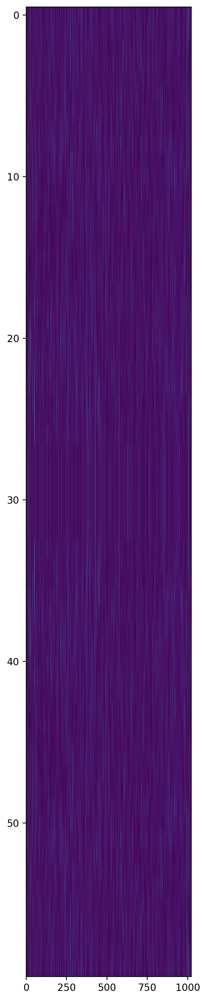

SV index 1 Max: 135232 Mean: 11699.936265884653 Std Dev: 11943.683759736832 Dist: 10.342877977944491


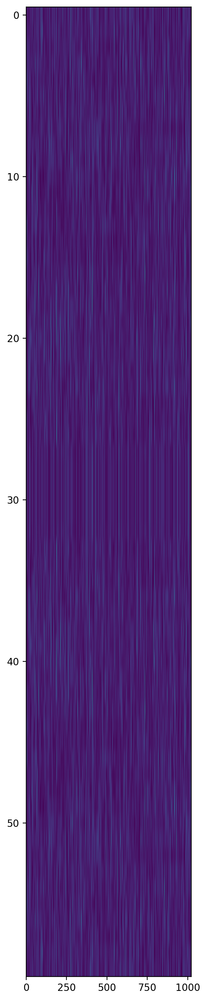

SV index 2 Max: 276436 Mean: 11862.835190615835 Std Dev: 12272.796096874752 Dist: 21.557692535668973


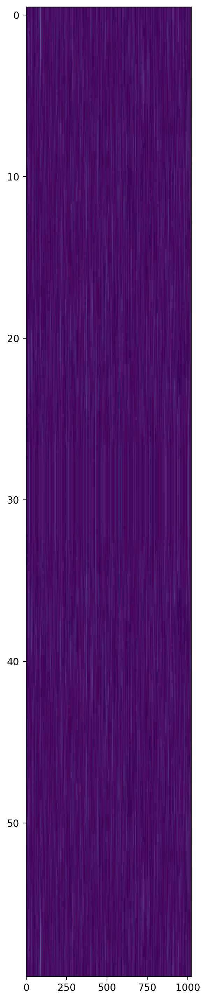

SV index 3 Max: 115684 Mean: 11762.849527533399 Std Dev: 11908.565846706904 Dist: 8.726588223148978


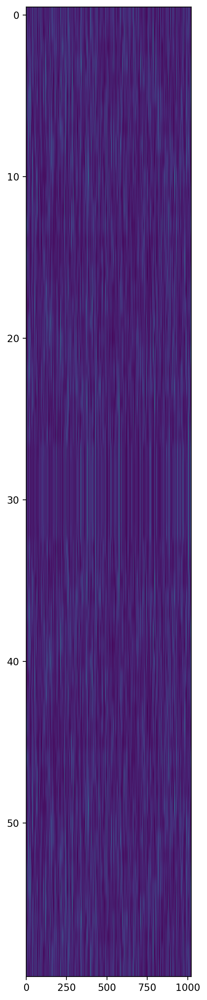

SV index 4 Max: 122440 Mean: 11791.994916911046 Std Dev: 11864.102508934087 Dist: 9.326285321604994


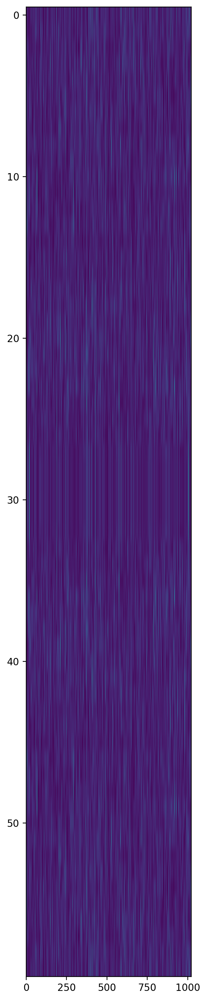

SV index 5 Max: 121160 Mean: 11596.88302378625 Std Dev: 11802.894420861565 Dist: 9.282732952568095


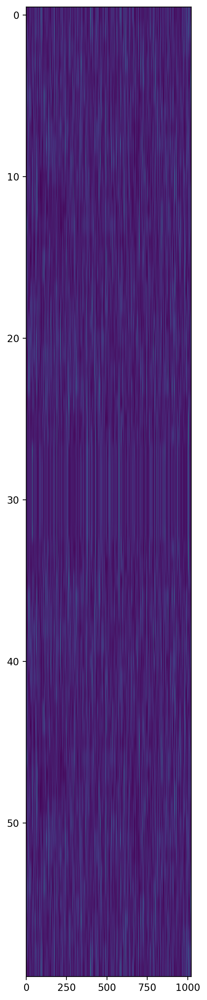

SV index 6 Max: 152200 Mean: 11584.35099380906 Std Dev: 11612.083889379832 Dist: 12.109424143481693


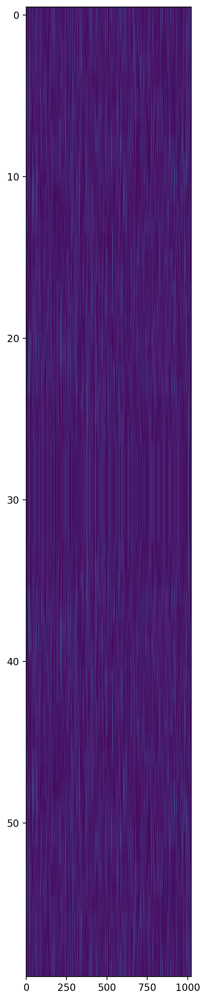

SV index 7 Max: 140260 Mean: 11645.59752362333 Std Dev: 11818.853628078143 Dist: 10.882138532524545


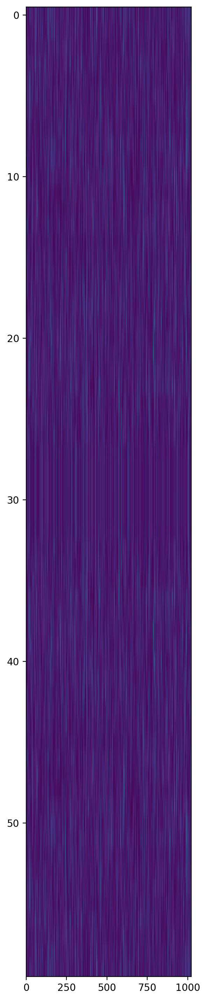

SV index 8 Max: 112900 Mean: 11617.82769631802 Std Dev: 11702.991870864322 Dist: 8.654382863909637


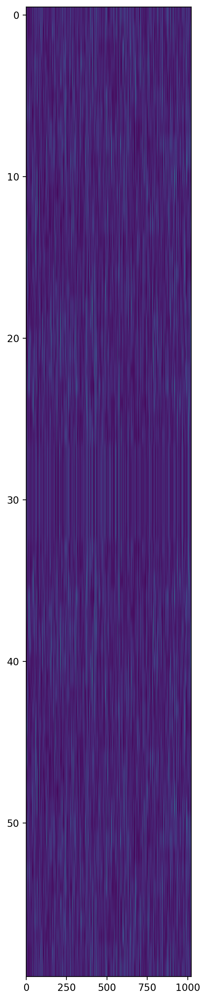

SV index 9 Max: 128020 Mean: 11712.316585206907 Std Dev: 11860.498763264295 Dist: 9.806306272298992


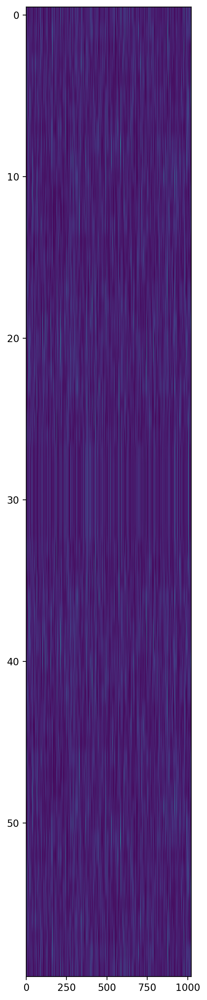

SV index 10 Max: 134740 Mean: 11770.022417725644 Std Dev: 11958.822322681835 Dist: 10.282783225990569


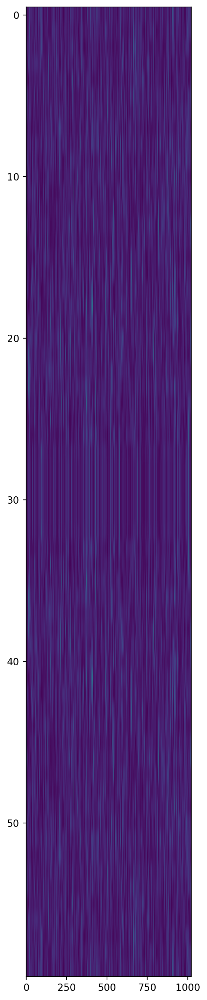

SV index 11 Max: 129928 Mean: 11899.079960899317 Std Dev: 11962.197237472064 Dist: 9.866826110287693


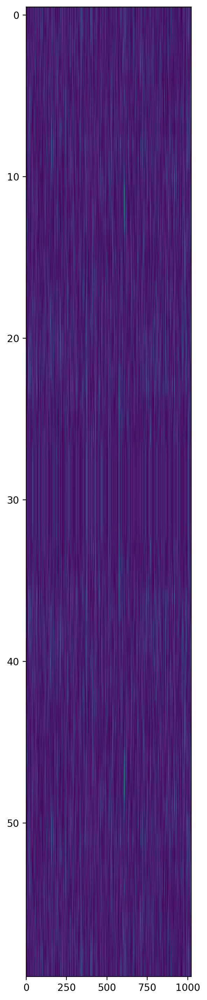

SV index 12 Max: 129028 Mean: 11669.985402411208 Std Dev: 11928.256802716933 Dist: 9.838655935950156


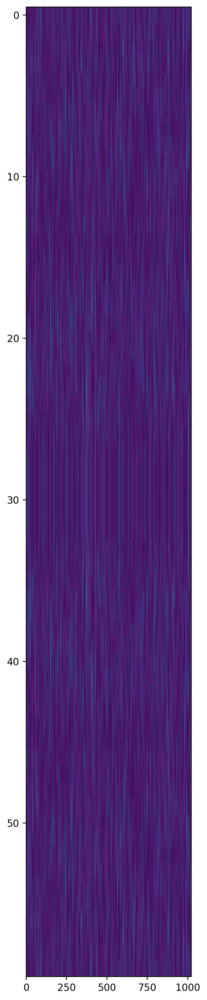

SV index 13 Max: 145928 Mean: 11705.941870316065 Std Dev: 11905.413197034548 Dist: 11.27403609671578


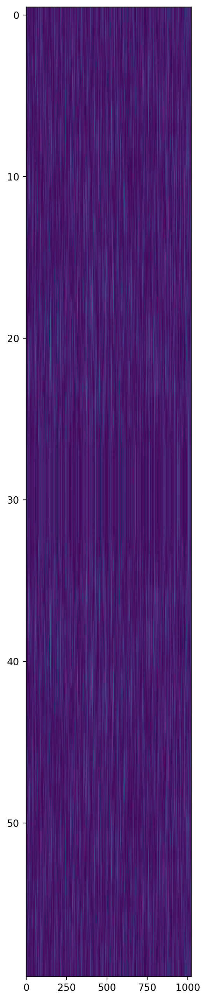

SV index 14 Max: 118084 Mean: 11761.672336265885 Std Dev: 11886.659875877254 Dist: 8.944676534364735


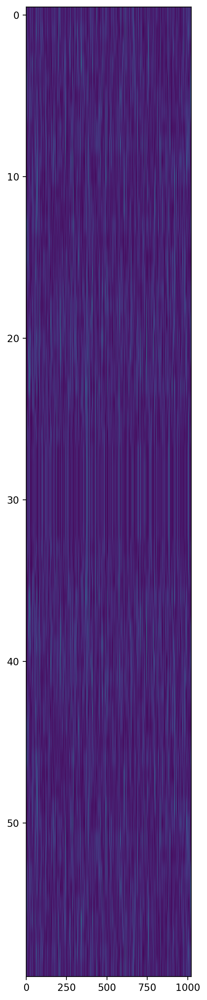

SV index 15 Max: 115208 Mean: 11978.45826001955 Std Dev: 12064.999651881606 Dist: 8.556116429218564


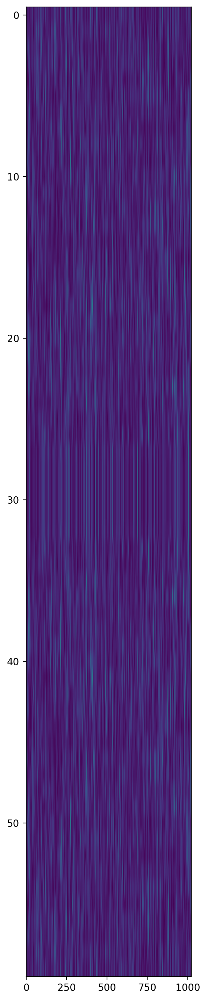

SV index 16 Max: 117000 Mean: 11723.27311827957 Std Dev: 11739.097066787457 Dist: 8.968042966402582


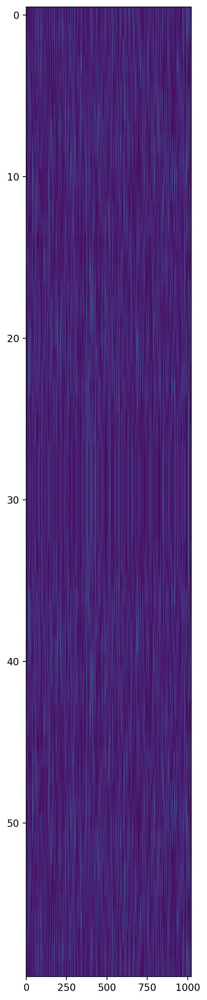

SV index 17 Max: 111656 Mean: 11493.930661453242 Std Dev: 11607.750406755018 Dist: 8.628895852228043


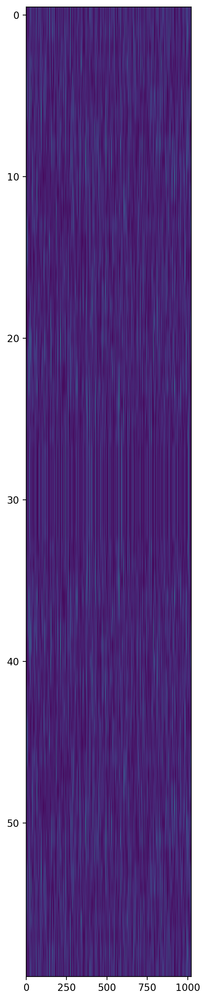

SV index 18 Max: 127240 Mean: 11693.216682958619 Std Dev: 11929.312660856769 Dist: 9.685954807453488


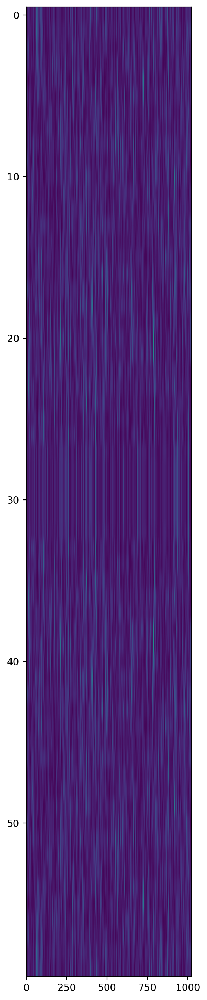

SV index 19 Max: 126088 Mean: 11639.496774193549 Std Dev: 11829.134117179017 Dist: 9.675137849658588


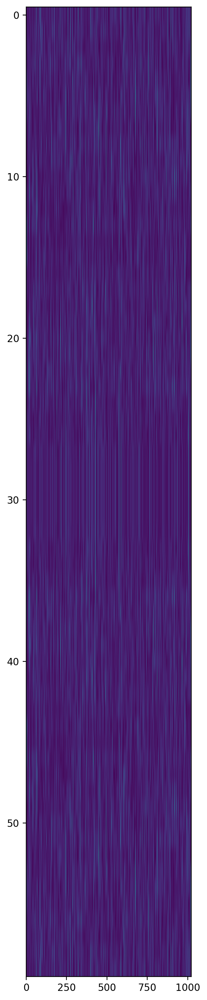

SV index 20 Max: 130500 Mean: 11739.652394916911 Std Dev: 11874.530815317628 Dist: 10.001266530201548


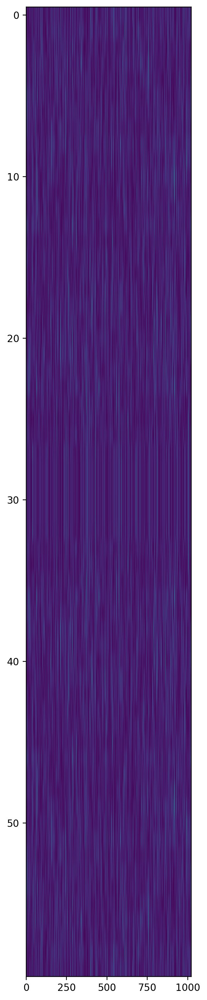

SV index 21 Max: 163664 Mean: 11715.318735744542 Std Dev: 11881.981593426006 Dist: 12.788159960483759


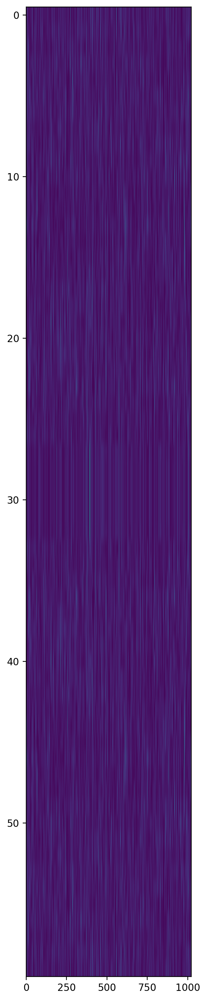

SV index 22 Max: 116136 Mean: 11688.024894102313 Std Dev: 11842.996999005018 Dist: 8.819387112457498


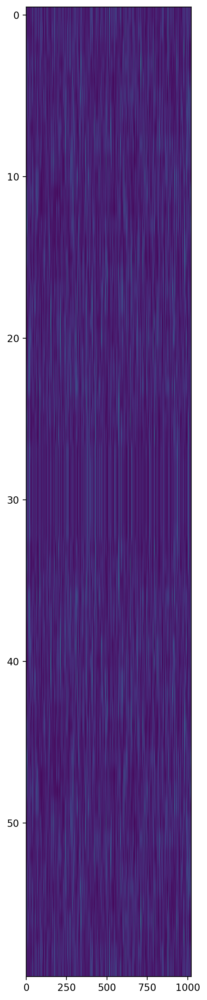

SV index 23 Max: 136016 Mean: 11882.182730531118 Std Dev: 11991.153517660721 Dist: 10.352116423715453


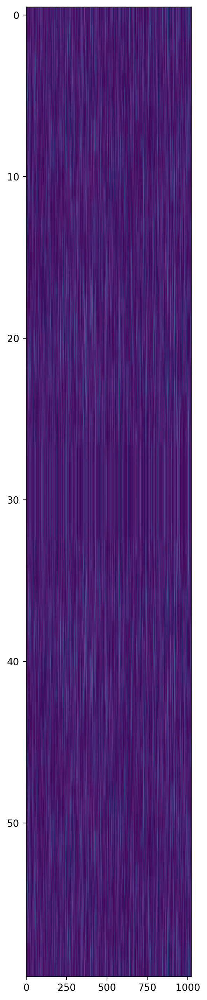

SV index 24 Max: 110084 Mean: 11561.670250896057 Std Dev: 11760.253772005904 Dist: 8.377568346664967


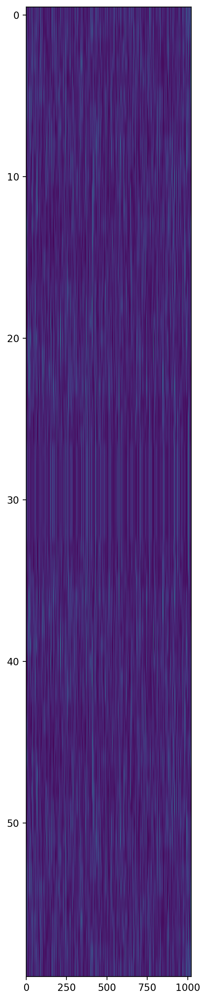

SV index 25 Max: 176200 Mean: 11670.097491039427 Std Dev: 11812.680966968526 Dist: 13.928243975184888


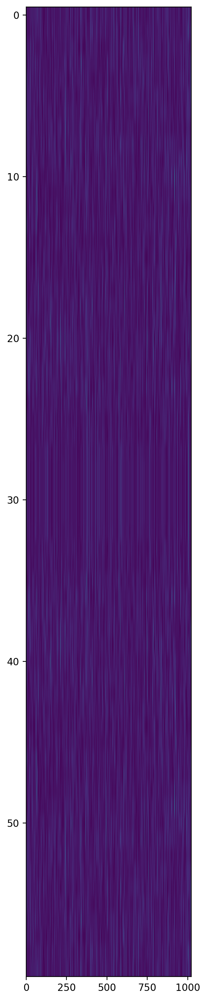

SV index 26 Max: 137096 Mean: 11776.514434669274 Std Dev: 11947.74615500192 Dist: 10.488964524314552


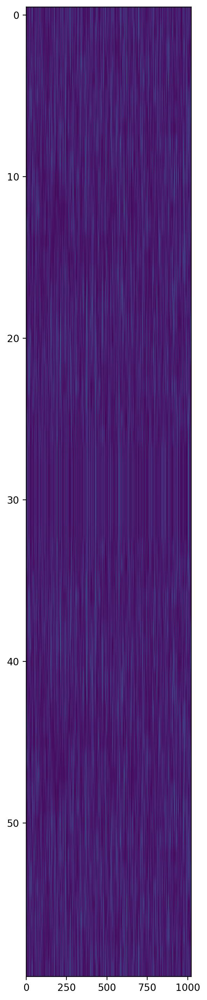

SV index 27 Max: 116008 Mean: 11788.305897686543 Std Dev: 11884.554770167739 Dist: 8.769339375163021


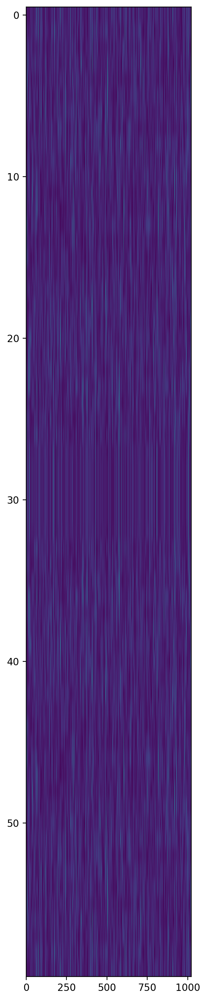

SV index 28 Max: 115880 Mean: 11831.512153796024 Std Dev: 11923.264275269044 Dist: 8.726510244515751


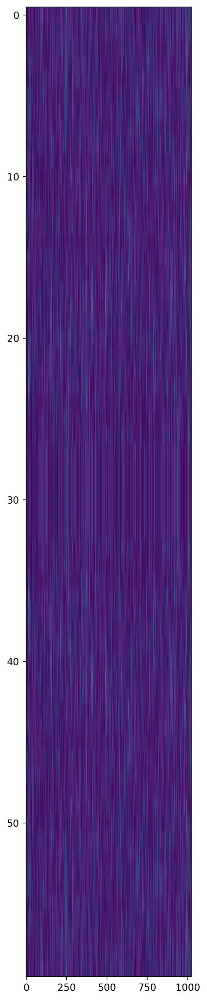

SV index 29 Max: 115272 Mean: 11870.443141088303 Std Dev: 12156.373868539635 Dist: 8.505953993938284


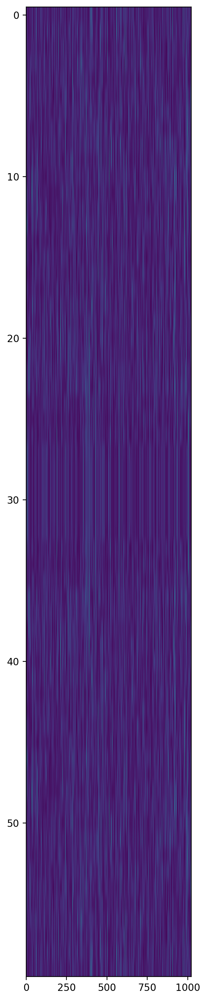

SV index 30 Max: 130244 Mean: 11631.018963831868 Std Dev: 11813.151253524326 Dist: 10.040756991135725


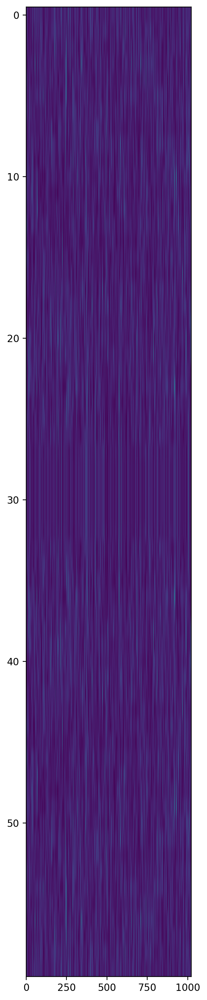

SV index 31 Max: 136328 Mean: 11696.515477354187 Std Dev: 11824.336097600195 Dist: 10.540252196310655


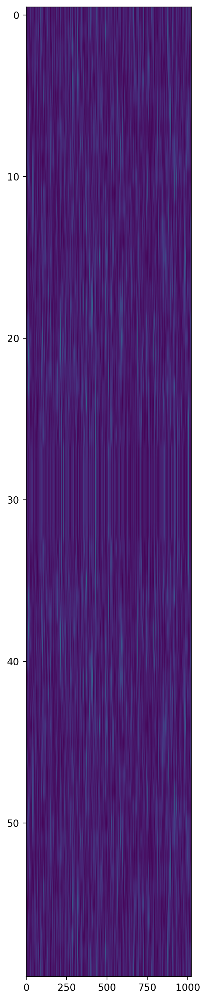

In [8]:
for i in range(sv_search_steps):
    dist = (np.max(magsq_results_table[i]) - np.mean(magsq_results_table[i]))/np.std(magsq_results_table[i])
    print(f"SV index {i} Max: {np.max(magsq_results_table[i])} Mean: {np.mean(magsq_results_table[i])} Std Dev: {np.std(magsq_results_table[i])} Dist: {dist}")
    fig, ax = plt.subplots(figsize=(18, 18))
    ax.imshow(magsq_results_table[i], aspect=100)
    plt.show()
    np.shape(magsq_results_table[i])

In [ ]:
ax = plt.figure(figsize=(18,18)).add_subplot(projection='3d')
code_array = np.arange(code_phase_search_steps)
X, Y = np.meshgrid(code_array, freq_search_step_array)
ax.plot_surface(X, Y, magsq_results_table[0], alpha=0.3, lw=0.5, rstride=10, cstride=1)
plt.show()